## Harmonization Demo

### Imports

In [5]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
from imports import *

In [7]:
# overall imports
import importlib
import data

# data load
from data.data_load import load_transcriptome, load_connectome

import harmonize.harmonizer
from harmonize.harmonizer import Harmonizer

from harmonize.data_utils import (
    find_gene_intersection,
    clean_csv_metadata,
    load_mni_atlas,
    get_mni_region_from_coords,
    assign_macro_regions
)

#### Paths

In [8]:
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
data_dir = par_dir + '/GeneEx2Conn_data'
samples_dir = data_dir + '/samples_files'
csv_paths = [samples_dir + '/' + f for f in os.listdir(samples_dir) if f.endswith('.csv') and 'srs' not in f]

print(par_dir)
print(data_dir)
print(samples_dir)
print(csv_paths)

/scratch/asr655/neuroinformatics
/scratch/asr655/neuroinformatics/GeneEx2Conn_data
/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files
['/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files/UTSW_samples.csv', '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files/HBT_samples.csv', '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files/AHBA_raw_samples.csv', '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files/GTEx_samples.csv', '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files/HBT_Brainspan_samples.csv', '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/samples_files/CBB_samples.csv']


### Prep all samples data

In [9]:
#### Find intersecting genes across all datasets
intersecting_genes, gene_count = find_gene_intersection(data_dir + '/genelist_files')
print(gene_count, 'overlapping genes')

#### Clean metadata for each dataset
sample_dfs = clean_csv_metadata(csv_paths, intersecting_genes)

#### Combine datasets into one main dataframe
combined_df = pd.concat(sample_dfs, axis=0, ignore_index=True)
threshold = int(combined_df.shape[1] * 0.5)  # drop null rows
combined_df = combined_df.dropna(thresh=threshold)
print(combined_df.shape)

#### Assign macro region for each sample using centroid coordinates
combined_df = assign_macro_regions(combined_df)

10605 overlapping genes
(3754, 10616)


In [10]:
#### Check how many samples are assigned to 'Unknown'
# List of regions to be labeled as 'Subcortical Microstructure'
subcortical_microstructure_regions = [
    'LH-GPe', 'LH-GPi', 'LH-VeP', 'LH-HTH', 'LH-SNc_PBP_VTA', 'LH-RN', 'LH-SNr',
    'RH-GPe', 'RH-GPi', 'RH-RN', 'RH-SNr', 'RH-HTH', 'RH-MN', 'RH-SNc_PBP_VTA',
    'Hypothalamus', 'Substantia nigra', 'Globus Pallidus', 'Internal Capsule', 'Substantia Nigra'
]

# Add the MNI region mapping based on the MNI.xml file.
mni_label_map = {
    1:'Caudate',
    2:'Cerebellum',
    3:'Frontal Lobe',
    4:'Insula',
    5:'Occipital Lobe',
    6:'Parietal Lobe',
    7:'Putamen',
    8:'Temporal Lobe',
    9:'Thalamus'
}


# Count the number of 'Unknown' entries in the 'macro region' column
unknown_count = combined_df[combined_df['macro region'] == 'Unknown'].shape[0]
print(f"Number of 'Unknown' entries in 'macro region': {unknown_count}")

# Retrieve the 'tissue sample local name' values corresponding to the 'Unknown' entries
unknown_tissues = combined_df.loc[combined_df['macro region'] == 'Unknown', 'tissue sample local name']
print("Tissue sample local names corresponding to 'Unknown' macro regions:")
print(unknown_tissues.tolist())


Number of 'Unknown' entries in 'macro region': 4
Tissue sample local names corresponding to 'Unknown' macro regions:
['Internal Capsule', 'Internal Capsule', 'Internal Capsule', 'Internal Capsule']


In [11]:
combined_df.head()

,ID,age,age decade,sex,ethnicity,tissue sample local name,tissue sample(s) in atlas name,atlas,centroid coordinates,macro region,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,1029,30,30-39,M,NaN,BA21,BA21: Middle temporal gyrus,Brodmann,"[(-61.68, -29.0, -9.41)]",Temporal Lobe,...,88292.0,149522.0,47315.0,30786.0,80127.0,136638.0,440872.0,839983.0,190575.0,198668.0
1,1029,30,30-39,M,NaN,BA22,BA22: Superior temporal gyrus,Brodmann,"[(-56.02, -21.08, 0.53)]",Temporal Lobe,...,84111.0,110218.0,50012.0,29532.0,92682.0,109457.0,509951.0,789183.0,168221.0,148489.0
2,1029,30,30-39,M,NaN,BA39,BA39: Angular gyrus,Brodmann,"[(-47.88, -61.58, 30.79)]",Parietal Lobe,...,97966.0,124002.0,62001.0,28133.0,82380.0,87682.0,443938.0,696614.0,132902.0,190575.0
3,1029,30,30-39,M,NaN,BA40,BA40: Supramarginal gyrus,Brodmann,"[(-53.23, -34.82, 34.29)]",Parietal Lobe,...,105728.0,158048.0,61147.0,29532.0,97290.0,86475.0,539028.0,632191.0,113317.0,229797.0
4,1029,30,30-39,M,NaN,BA44,BA44: Pars opercularis (part of Broca's area),Brodmann,"[(-50.54, 10.45, 17.24)]",Frontal Lobe,...,85285.0,65083.0,42642.0,26432.0,68319.0,131984.0,419991.0,509951.0,152664.0,231395.0


In [12]:
combined_df.tail()

,ID,age,age decade,sex,ethnicity,tissue sample local name,tissue sample(s) in atlas name,atlas,centroid coordinates,macro region,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
4132,HD,34,30-39,M,Asian (Chinese),Putamen,"NLL, NLR",AAL,"[(-24.35, 2.53, 1.17), (27.51, 3.66, 1.21)]",Putamen,...,4.983412,3.845765,2.694825,1.291228,3.278738,6.265896,13.113365,29.445589,9.937402,15.155973
4133,HD,34,30-39,M,Asian (Chinese),Substantia Nigra,"SNpcL, SNpcR, SNprL, SNprR",AAL,"[(-7.74, -19.16, -14.97), (9.19, -18.25, -14.4...",Subcortical Microstructure,...,4.393289,1.883726,2.312132,0.677941,2.741483,5.212453,11.836250,42.413494,8.841928,8.233562
4134,HD,34,30-39,M,Asian (Chinese),Supramarginal (BA40),"BA40: Supramarginal gyrus, BA140: Supramargina...",Brodmann,"[(-53.23, -34.82, 34.29), (51.4, -34.34, 33.38)]",Parietal Lobe,...,6.835209,4.652404,3.422258,1.116992,4.678360,7.041778,28.182423,76.896385,11.732084,13.506960
4135,HD,34,30-39,M,Asian (Chinese),Thalamus,"tAVL, tAVR, tLPL, tLPR, tVAL, tVAR, tVLL, tVLR...",AAL,"[(-5.79, -6.63, 8.63), (5.52, -5.6, 8.72), (-1...",Thalamus,...,2.692532,1.996908,4.862280,0.741620,2.299618,6.421989,13.797039,31.340384,9.266891,9.038833
4136,HD,34,30-39,M,Asian (Chinese),Ventrolateral Prefrontal (BA44),"BA44: Pars opercularis (part of Broca's area),...",Brodmann,"[(-50.54, 10.45, 17.24), (46.32, 11.41, 16.67)]",Frontal Lobe,...,5.473664,6.675751,4.057633,0.726666,2.840803,6.439681,22.157438,109.593491,12.028059,13.516845


## Harmonizer <a id="class_test"></a>

The `Harmonizer` class is designed to process and harmonize gene expression data from various datasets. Below is an overview of its functionality and how an instance of the class functions.

### Functionality

1. **Initialization (`__init__`)**:
   - Initializes with a combined DataFrame (`combined_df`).
   - Stores a copy of the original dataset.
   - Identifies metadata and gene columns.
   - Performs initial statistical processing on the gene data.

2. **Column Identification (`get_gene_columns`)**:
   - Identifies metadata and gene expression columns.

3. **Gene Data Processing (`statistical_process_gene_data`)**:
   - Applies preprocessing steps (e.g., log transformation, min-max scaling, z-score normalization) to gene data.

4. **Batch Effect Correction (`apply_combat`)**:
   - Corrects for batch effects using the ComBat method.

5. **Data Conversion (`df_to_anndata`)**:
   - Converts a DataFrame to AnnData format for bioinformatics analyses.
   - Optionally performs PCA and computes neighborhood graphs.

6. **Harmonization Evaluation (`run_scib_metrics`, `evaluate_harmonization_with_scib`)**:
   - Evaluates harmonization quality using scib metrics.

7. **Visualization (`run_umap`, `plot_umap`, `run_pca`, `plot_pca`)**:
   - Runs UMAP and PCA on the data and plots results using Plotly.

8. **Custom Plots (`plot_gene_expression_heatmap`, `_plot_single_heatmap`)**:
   - Generates heatmaps to visualize gene expression data.

9. **Macro Region Evaluation (`evaluate_harmonization_for_macro_region`, `_plot_macro_region_expression`)**:
   - Evaluates harmonization quality for specific macro regions.

10. **Statistical Analysis (`create_and_display_macro_region_stats`)**:
    - Computes and displays statistics (mean, median, std deviation) for gene expression values.

11. **Distribution Similarity (`compute_distribution_similarity`, `plot_similarity_heatmap`)**:
    - Computes and plots pairwise similarity (KL-Divergence or correlation) between datasets.

## How an Instance Functions

1. **Instantiation**:
   - Create an instance by passing a DataFrame containing gene expression data.

2. **Data Processing**:
   - Use `statistical_process_gene_data` to apply preprocessing steps.

3. **Batch Correction**:
   - Apply batch effect correction using `apply_combat`.

4. **Data Conversion and Evaluation**:
   - Convert data to AnnData format and evaluate harmonization quality.

5. **Visualization**:
   - Visualize data using UMAP or PCA.

6. **Custom Analysis**:
   - Perform custom analyses and visualizations, such as heatmaps and macro region evaluations.

7. **Statistical and Similarity Analysis**:
   - Compute and display statistics for macro regions and assess distribution similarity.

The `Harmonizer` class provides a comprehensive suite of tools for preprocessing, harmonizing, evaluating, and visualizing gene expression data across multiple datasets.

#### Example Harmonizer usage

In [13]:
# Initialize Harmonizer
harmonizer = Harmonizer(combined_df)

For each dataset define some basic preprocessing steps based on recommendations from the literature. They happen in the order the array is passed. Options are min_max, log_transform, scaled_robust_sigmoid, z_score.

In [14]:
lit_preprocessing_steps = {
    'AHBA': ['scaled_robust_sigmoid'], # scaled_robust_sigmoid 
    'Chinese Brain Bank': ['log_transform', 'min_max'],
    'UTSW Medical Center': ['log_transform', 'min_max'],
    'GTEx': ['min_max'],
    'Yale HBT': ['log_transform', 'min_max'],
    'HBT Brainspan': ['log_transform', 'min_max']
}

minimal_preprocessing_steps = {
    'AHBA': ['min_max'], 
    'Chinese Brain Bank': ['log_transform', 'min_max'],
    'UTSW Medical Center': ['log_transform', 'min_max'],
    'GTEx': ['min_max'],
    'Yale HBT': ['min_max'],
    'HBT Brainspan': ['log_transform', 'min_max']
}


Call the statistical processing function with the preprocessing steps followed by ComBat batch correction. The harmonizer object stores both versions of the dataframes and also returns the dfs when the methods are called.

In [15]:
processed_df = harmonizer.statistical_process_gene_data(preprocessing_steps=lit_preprocessing_steps)


In [16]:
combat_df = harmonizer.apply_combat(processed_df)
combat_scib_df = harmonizer.apply_integration(processed_df, method='combat')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x1471b04b4680>
Traceback (most recent call last):
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'


In [17]:
from harmony import harmonize

gene_cols = harmonizer.gene_columns
X = processed_df[gene_cols].values

# Create metadata dataframe
metadata = pd.DataFrame({
    'batch': processed_df['dataset'],
    'region': processed_df['macro region']
}, index=processed_df.index)

# Apply Harmony
Z_harmony = harmonize(X, metadata, batch_key='batch') # can consider passing in 2 batches to correct for MH vs RNA-seq

#print(f"Original PCA shape: {X_pca.shape}")
print(f"Harmonized shape: {Z_harmony.shape}")

# Create a new dataframe with harmonized data
harmony_df = processed_df.copy()
harmony_df[harmonizer.gene_columns] = Z_harmony

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x147197452ac0>
Traceback (most recent call last):
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Exception 

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
Harmonized shape: (3754, 10605)


Checkout the heatmaps for each version of the harmonized data

Original Data Heatmap


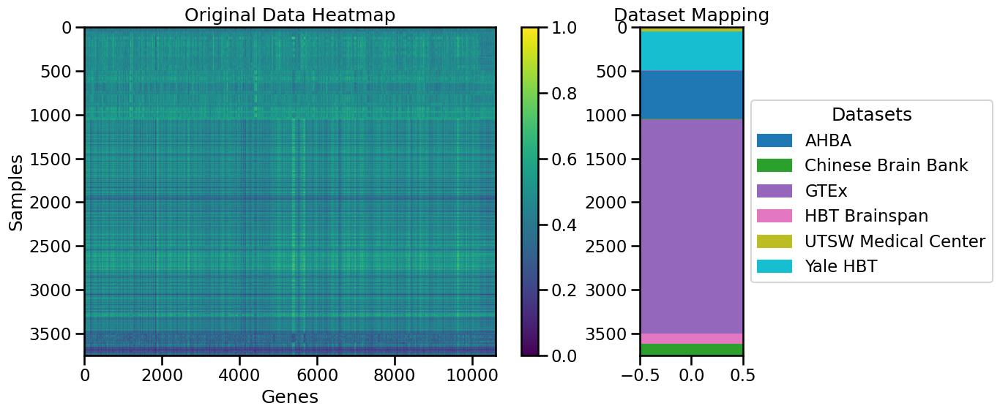

Minimal Processed Data Heatmap


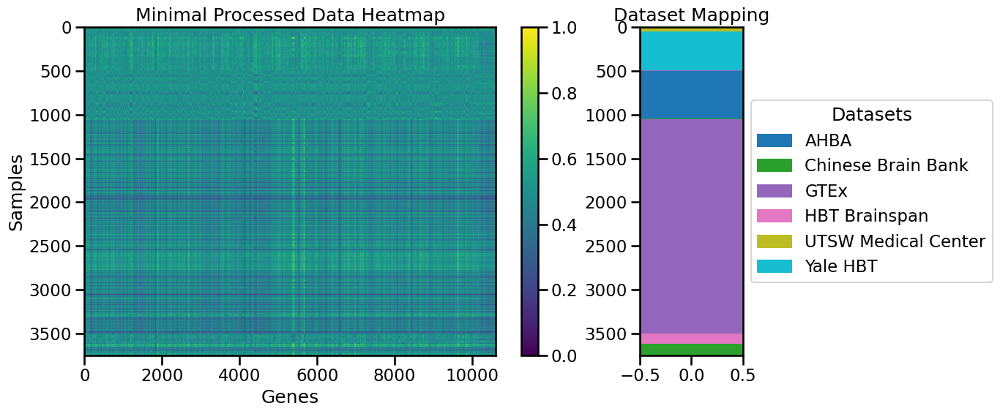

Combat Adjusted Data Heatmap


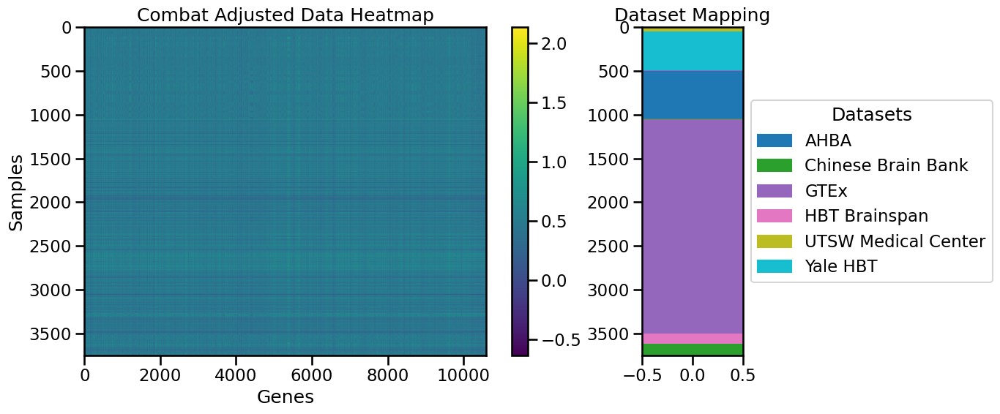

SCIB Combat Adjusted Data Heatmap


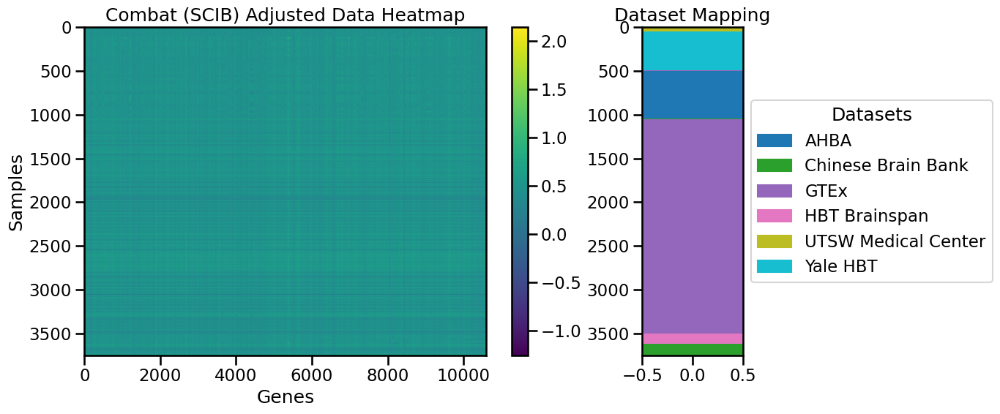

SCIB Harmony Adjusted Data Heatmap


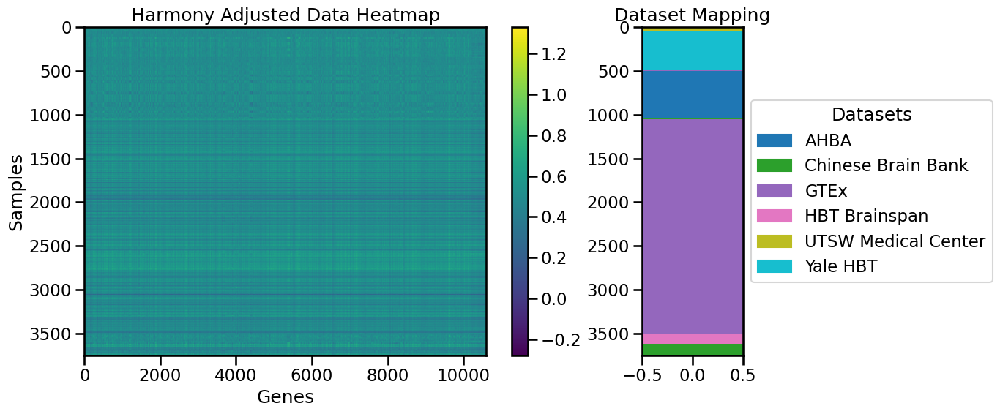

In [18]:
# Plot heatmap for the original data (minmax_df)
print("Original Data Heatmap")
harmonizer._plot_single_heatmap(harmonizer.minmax_df, title="Original Data Heatmap")

# Plot heatmap for the minimal processed data
print("Minimal Processed Data Heatmap")
harmonizer._plot_single_heatmap(processed_df, title="Minimal Processed Data Heatmap")

# Plot heatmap for the Combat adjusted data
print("Combat Adjusted Data Heatmap")
harmonizer._plot_single_heatmap(combat_df, title="Combat Adjusted Data Heatmap")

print("SCIB Combat Adjusted Data Heatmap")
harmonizer._plot_single_heatmap(combat_scib_df, title="Combat (SCIB) Adjusted Data Heatmap")

print("SCIB Harmony Adjusted Data Heatmap")
harmonizer._plot_single_heatmap(harmony_df, title="Harmony Adjusted Data Heatmap")

Then we can evaluate the harmonization using SCIB metrics.

In [124]:
# Get metrics for each harmonization strategy compared to minmax_df
scib_metrics_processed = harmonizer.evaluate_harmonization_with_scib(df_pre=harmonizer.minmax_df, df_post=processed_df)
scib_metrics_combat = harmonizer.evaluate_harmonization_with_scib(df_pre=harmonizer.minmax_df, df_post=combat_df)
scib_metrics_combat_scib = harmonizer.evaluate_harmonization_with_scib(df_pre=harmonizer.minmax_df, df_post=combat_scib_df)
scib_metrics_harmony = harmonizer.evaluate_harmonization_with_scib(df_pre=harmonizer.minmax_df, df_post=harmony_df)

# Combine all metrics into a single dataframe
metrics_df = pd.DataFrame({
    'Literature Adjusted': scib_metrics_processed[0],
    'Combat Adjusted': scib_metrics_combat[0],
    'Combat (SCIB) Adjusted': scib_metrics_combat_scib[0], 
    'Harmony Adjusted': scib_metrics_harmony[0]
})

# Display the metrics table
display(metrics_df)


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f33abb81c60>
Traceback (most recent call last):
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Exception 

Silhouette score...
PC regression...
Isolated labels ASW...
Graph connectivity...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f33c7298720>
Traceback (most recent call last):
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Exception 

Silhouette score...
PC regression...
Isolated labels ASW...
Graph connectivity...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f33c7298720>
Traceback (most recent call last):
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Exception 

Silhouette score...
PC regression...
Isolated labels ASW...
Graph connectivity...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f33c7298720>
Traceback (most recent call last):
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ext3/miniconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Exception 

Silhouette score...
PC regression...


And we can see how they visually change with each step of processing

Colored by dataset

2D UMAP for Original Data (minmax_df)


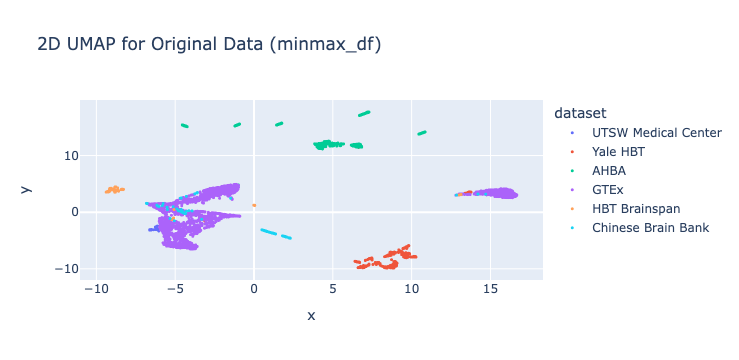

2D UMAP for Minimal Processed Data


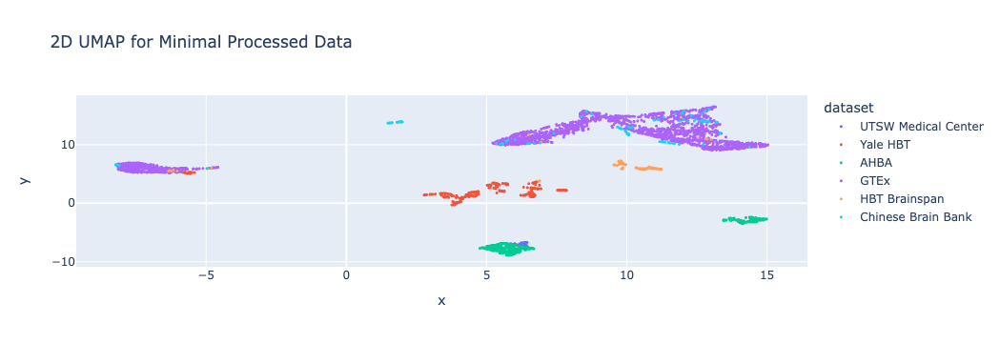

2D UMAP for Combat Adjusted Data


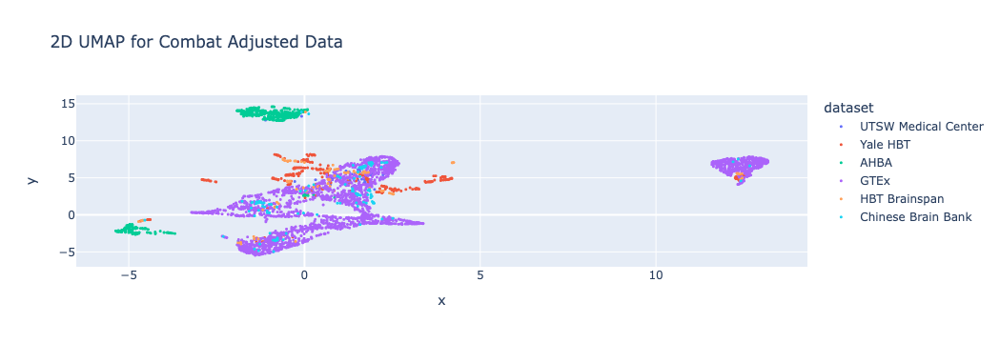

2D UMAP for Combat (SCIB) Adjusted Data


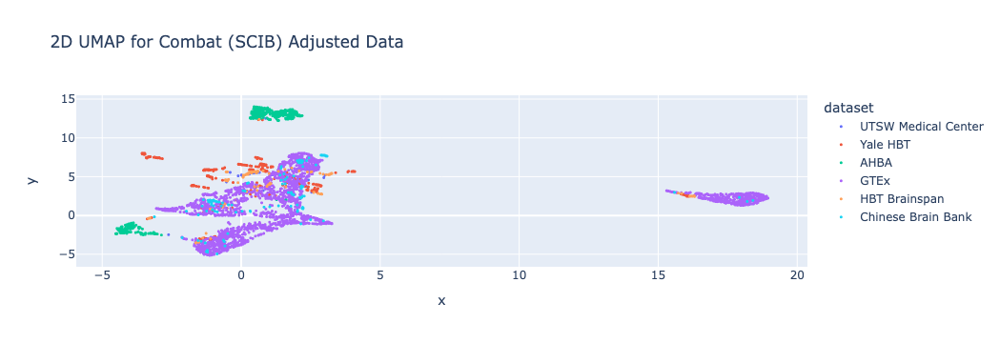

2D UMAP for Harmony Adjusted Data


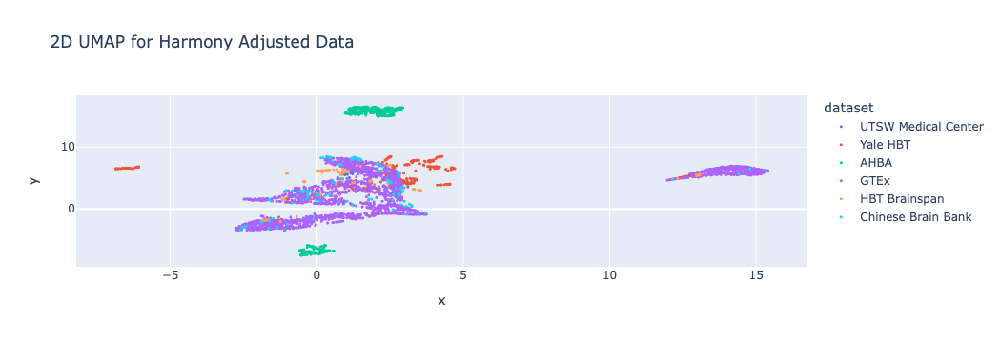

In [19]:
# Run 2D UMAPs for all the versions of the harmonized data

# UMAP for the original data (minmax_df)
print("2D UMAP for Original Data (minmax_df)")
umap_results_minmax = harmonizer.run_umap(harmonizer.minmax_df, n_components=2)
harmonizer.plot_umap(umap_results_minmax, harmonizer.minmax_df, title="2D UMAP for Original Data (minmax_df)")

# UMAP for the minimal processed data
print("2D UMAP for Minimal Processed Data")
umap_results_processed = harmonizer.run_umap(processed_df, n_components=2)
harmonizer.plot_umap(umap_results_processed, processed_df, title="2D UMAP for Minimal Processed Data")

# UMAP for the Combat adjusted data
print("2D UMAP for Combat Adjusted Data")
umap_results_combat = harmonizer.run_umap(combat_df, n_components=2)
harmonizer.plot_umap(umap_results_combat, combat_df, title="2D UMAP for Combat Adjusted Data")

# UMAP for the Combat adjusted data
print("2D UMAP for Combat (SCIB) Adjusted Data")
umap_results_combat_scib = harmonizer.run_umap(combat_scib_df, n_components=2)
harmonizer.plot_umap(umap_results_combat_scib, combat_scib_df, title="2D UMAP for Combat (SCIB) Adjusted Data")

# UMAP for the Harmony adjusted data
print("2D UMAP for Harmony Adjusted Data")
umap_results_harmony = harmonizer.run_umap(harmony_df, n_components=2)
harmonizer.plot_umap(umap_results_harmony, harmony_df, title="2D UMAP for Harmony Adjusted Data")


Colored by macro region

2D UMAP for Original Data (minmax_df)


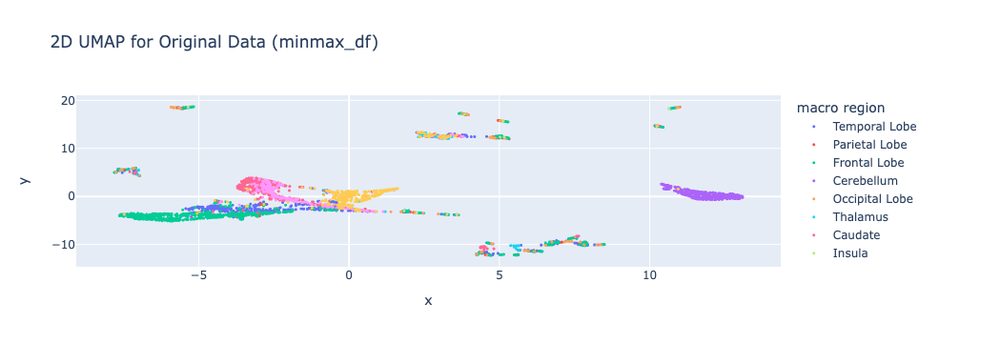

2D UMAP for Minimal Processed Data


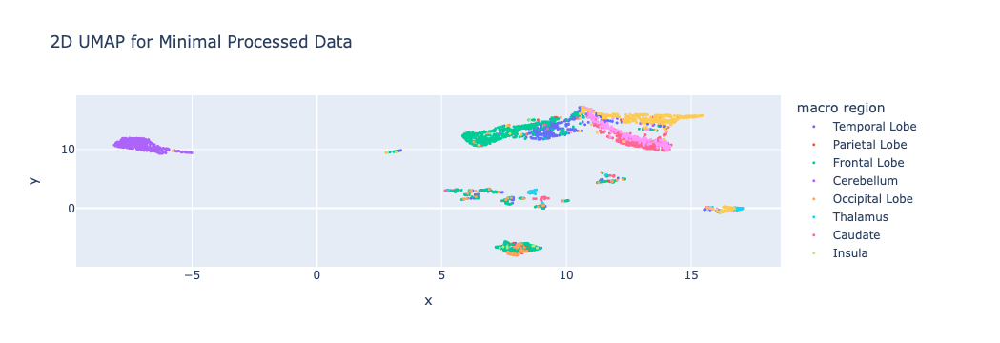

2D UMAP for Combat Adjusted Data


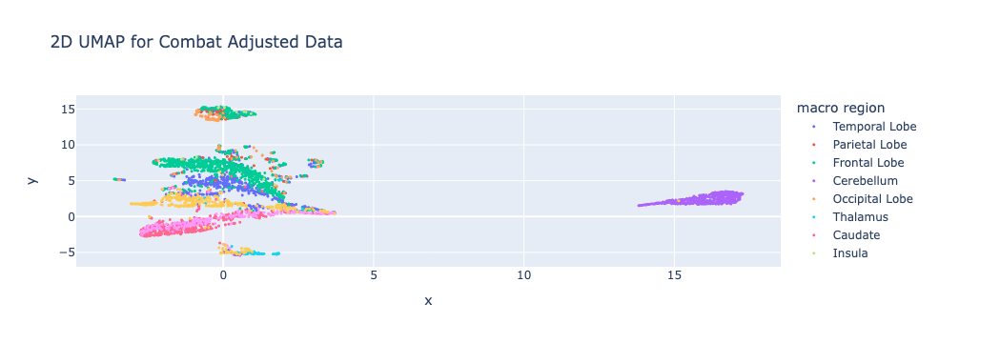

2D UMAP for Combat Adjusted Data


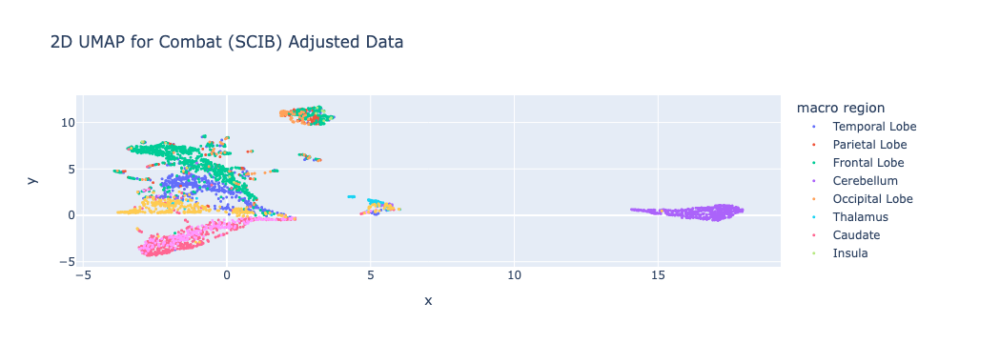

2D UMAP for Harmony Adjusted Data


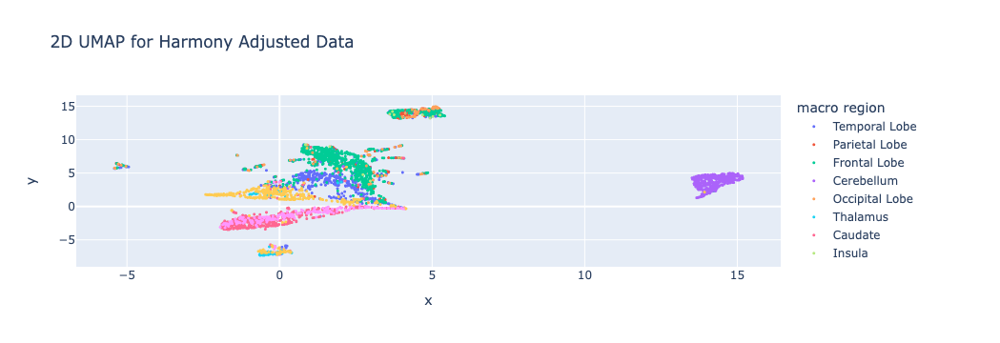

In [20]:
# Run 2D UMAPs for minmax, processed, and combat data
# UMAP for the original data (minmax_df)
print("2D UMAP for Original Data (minmax_df)")
umap_results_minmax = harmonizer.run_umap(harmonizer.minmax_df, n_components=2)
harmonizer.plot_umap(umap_results_minmax, harmonizer.minmax_df, title="2D UMAP for Original Data (minmax_df)", color_by='macro region')

# UMAP for the minimal processed data
print("2D UMAP for Minimal Processed Data")
umap_results_processed = harmonizer.run_umap(processed_df, n_components=2)
harmonizer.plot_umap(umap_results_processed, processed_df, title="2D UMAP for Minimal Processed Data", color_by='macro region')

# UMAP for the Combat adjusted data
print("2D UMAP for Combat Adjusted Data")
umap_results_combat = harmonizer.run_umap(combat_df, n_components=2)
harmonizer.plot_umap(umap_results_combat, combat_df, title="2D UMAP for Combat Adjusted Data", color_by='macro region')

# UMAP for the Combat adjusted data
print("2D UMAP for Combat Adjusted Data")
umap_results_combat_scib = harmonizer.run_umap(combat_scib_df, n_components=2)
harmonizer.plot_umap(umap_results_combat_scib, combat_scib_df, title="2D UMAP for Combat (SCIB) Adjusted Data", color_by='macro region')

# UMAP for the Harmony adjusted data
print("2D UMAP for Harmony Adjusted Data")
umap_results_harmony = harmonizer.run_umap(harmony_df, n_components=2)
harmonizer.plot_umap(umap_results_harmony, harmony_df, title="2D UMAP for Harmony Adjusted Data", color_by='macro region')


### SCIB metrics

In [151]:
# Convert each result into a dictionary for easier comparison
metrics_dict = {
    'Minimal Processing': metrics_processed_minimal.iloc[:, 0],
    'Minimal Processing (Combat)': metrics_combat_minimal.iloc[:, 0],
    'Z-score Processing': metrics_processed_zscore.iloc[:, 0],
    'Z-score Processing (Combat)': metrics_combat_zscore.iloc[:, 0],
    'Literature Processing': metrics_processed_lit.iloc[:, 0],
    'Literature Processing (Combat)': metrics_combat_lit.iloc[:, 0],
}

In [152]:
# Drop rows that have more than 50% NaN values (adjust the threshold as needed)
threshold = int(comparison_df.shape[1] * 0.5)  # Drop rows with more than 50% NaNs
comparison_df = comparison_df.dropna(thresh=threshold)


In [153]:
comparison_df

,Minimal Processing,Minimal Processing (Combat),Z-score Processing,Z-score Processing (Combat),Literature Processing,Literature Processing (Combat)
ASW_label,0.519226,0.495757,0.521213,0.496017,0.517616,0.499503
ASW_label/batch,0.729068,0.871062,0.703543,0.870481,0.755174,0.845744
PCR_batch,0.190404,0.936926,0.000000,0.937696,0.353544,0.933915
isolated_label_silhouette,0.684942,0.767422,0.723562,0.767294,0.695324,0.758800
graph_conn,0.706651,0.798070,0.691593,0.781926,0.851580,0.897431
hvg_overlap,0.809333,0.482333,1.000000,0.495667,0.671000,0.459000


In [154]:
# Save the comparison table to a CSV file
comparison_df.to_csv('fast_scib_metrics_comparison.csv', index=True)


In [77]:
def evaluate_stats_and_divergence(harmonizer, processed_df, combat_df, experiment_name):
    """
    Evaluate and display stats and divergences for minmax_df vs processed_df and minmax_df vs combat_df.
    
    Parameters:
    - harmonizer: Harmonizer object
    - processed_df: DataFrame after preprocessing
    - combat_df: DataFrame after Combat adjustment
    - experiment_name: Name of the experiment to print in the output
    """
    print(f"\nEvaluating stats and divergences for {experiment_name}: minmax_df vs processed_df")
    display_stats_and_divergences(harmonizer, harmonizer.minmax_df, processed_df)

    print(f"\nEvaluating stats and divergences for {experiment_name}: minmax_df vs combat_df")
    display_stats_and_divergences(harmonizer, harmonizer.minmax_df, combat_df)
